
# Problem Statement:
    
**INX Future Inc , (referred as INX ) , is one of the leading data analytics and automation solutions provider 
with over 15 years of global business presence. INX is consistently rated as top 20 best employers past 5 
years. INX human resource policies are considered as employee friendly and widely perceived as best 
practices in the industry.
Recent years, the employee performance indexes are not healthy and this is becoming a growing 
concerns among the top management. There has been increased escalations on service delivery and 
client satisfaction levels came down by 8 percentage points.
CEO, Mr. Brain, knows the issues but concerned to take any actions in penalizing non-performing 
employees as this would affect the employee morale of all the employees in general and may further 
reduce the performance. Also, the market perception best employer and thereby attracting best talents 
to join the company.
Mr. Brain decided to initiate a data science project , which analyses the current employee data and find 
the core underlying causes of this performance issues. Mr. Brain, being a data scientist himself, expects 
the findings of this project will help him to take right course of actions. He also expects a clear indicators 
of non performing employees, so that any penalization of non-performing employee, if required, may 
not significantly affect other employee morals.**


    

 ## AIM: 
#####  The aim of this project include the Following: 
##### 1. Evaluate Department wise performances
##### 2. To explore top 3 Important Factors effecting employee performance
##### 3. Developing a trained model which can predict the employee performance based on factors as inputs. This
   ###### will be used to hire employees
##### 4. Provide Recommendations to improve the employee performance based on insights from analysis.

In [1]:
# Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt #Plotting Library
import seaborn as sns
sns.set_theme(style="whitegrid")

from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder,OneHotEncoder,PowerTransformer,LabelEncoder
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,accuracy_score,roc_auc_score
from sklearn.model_selection import GridSearchCV,cross_val_score,KFold
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier,GradientBoostingClassifier,RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy import stats
from sklearn.ensemble import RandomForestClassifier
import warnings
warnings.filterwarnings('ignore')
import sweetviz as sv
import statsmodels.api as sm
!pip install imblearn
from imblearn.over_sampling import SMOTE # Library to balance imbalance data in given variaables
from collections import Counter #Libary that checks the spread of 
!pip3 install xgboost
from xgboost import XGBClassifier
 #### The 3 top factor which are affecting the INX Future comapany:-
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objects as go # Import statements required for Plotly (advanced visualiazation libray)
import plotly.tools as tls
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from plotly.subplots import make_subplots


In [2]:
# Loading the dataset
data=pd.read_excel("INX_Future_Inc_Employee_Performance_CDS_Project2_Data_V1.8.xls")
pd.set_option('display.max_columns',None)
data.shape

(1200, 28)

In [3]:
#Making many duplicate copies of the Datasets To Caaryout the respective Tasks
data1 = data.copy()
data1 = data.copy()
data2 = data1.copy()
data3 = data2.copy()
data4 = data3.copy()
data5 = data4.copy()
data6 = data5.copy()
data7 = data6.copy()
data3 = data7.copy()
data8 = data6.copy()

In [4]:
data.drop(["EmpNumber"],axis=1,inplace=True)   # i drop Empnumber column (not important)

In [5]:
data.shape

(1200, 27)

# Basic Checks

In [6]:
data.head(3)

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,55,3,2,4,1,No,12,4,10,2,2,10,7,0,8,No,3
1,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,42,3,2,1,2,No,12,4,20,2,3,7,7,1,7,No,3
2,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,48,2,3,1,5,Yes,21,3,20,2,3,18,13,1,12,No,4


In [7]:
columns = data.columns.to_list()
for col in columns:
    print(col)

Age
Gender
EducationBackground
MaritalStatus
EmpDepartment
EmpJobRole
BusinessTravelFrequency
DistanceFromHome
EmpEducationLevel
EmpEnvironmentSatisfaction
EmpHourlyRate
EmpJobInvolvement
EmpJobLevel
EmpJobSatisfaction
NumCompaniesWorked
OverTime
EmpLastSalaryHikePercent
EmpRelationshipSatisfaction
TotalWorkExperienceInYears
TrainingTimesLastYear
EmpWorkLifeBalance
ExperienceYearsAtThisCompany
ExperienceYearsInCurrentRole
YearsSinceLastPromotion
YearsWithCurrManager
Attrition
PerformanceRating


In [8]:
data5.drop(["EmpNumber"],axis=1,inplace=True)   # i drop Empnumber column (not important)

In [9]:
def all_col_unique(data):
    """
    This function lists all the unique values of all columns of dataframe in sorted manner.
    """
    for col in data:
        print("---------------")             # all unique values...
        print(f"{col}")
        print(sorted(data[col].unique()))
        print("\n")

In [10]:
print(all_col_unique(data5))

---------------
Age
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


---------------
Gender
['Female', 'Male']


---------------
EducationBackground
['Human Resources', 'Life Sciences', 'Marketing', 'Medical', 'Other', 'Technical Degree']


---------------
MaritalStatus
['Divorced', 'Married', 'Single']


---------------
EmpDepartment
['Data Science', 'Development', 'Finance', 'Human Resources', 'Research & Development', 'Sales']


---------------
EmpJobRole
['Business Analyst', 'Data Scientist', 'Delivery Manager', 'Developer', 'Finance Manager', 'Healthcare Representative', 'Human Resources', 'Laboratory Technician', 'Manager', 'Manager R&D', 'Manufacturing Director', 'Research Director', 'Research Scientist', 'Sales Executive', 'Sales Representative', 'Senior Developer', 'Senior Manager R&D', 'Technical Architect', 'Technical Lead']


---------------
Business

In [11]:
# Analysis and Data modelling

In [12]:
data.info() #This gives a summary of the datatypes of each variable in the Dataset.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   Age                           1200 non-null   int64 
 1   Gender                        1200 non-null   object
 2   EducationBackground           1200 non-null   object
 3   MaritalStatus                 1200 non-null   object
 4   EmpDepartment                 1200 non-null   object
 5   EmpJobRole                    1200 non-null   object
 6   BusinessTravelFrequency       1200 non-null   object
 7   DistanceFromHome              1200 non-null   int64 
 8   EmpEducationLevel             1200 non-null   int64 
 9   EmpEnvironmentSatisfaction    1200 non-null   int64 
 10  EmpHourlyRate                 1200 non-null   int64 
 11  EmpJobInvolvement             1200 non-null   int64 
 12  EmpJobLevel                   1200 non-null   int64 
 13  EmpJobSatisfaction

* THE Dataest contains 19 integer variables and 8 object type variables.

In [13]:
data.dtypes

Age                              int64
Gender                          object
EducationBackground             object
MaritalStatus                   object
EmpDepartment                   object
EmpJobRole                      object
BusinessTravelFrequency         object
DistanceFromHome                 int64
EmpEducationLevel                int64
EmpEnvironmentSatisfaction       int64
EmpHourlyRate                    int64
EmpJobInvolvement                int64
EmpJobLevel                      int64
EmpJobSatisfaction               int64
NumCompaniesWorked               int64
OverTime                        object
EmpLastSalaryHikePercent         int64
EmpRelationshipSatisfaction      int64
TotalWorkExperienceInYears       int64
TrainingTimesLastYear            int64
EmpWorkLifeBalance               int64
ExperienceYearsAtThisCompany     int64
ExperienceYearsInCurrentRole     int64
YearsSinceLastPromotion          int64
YearsWithCurrManager             int64
Attrition                

In [14]:
data1.head(3)

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,55,3,2,4,1,No,12,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,42,3,2,1,2,No,12,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,48,2,3,1,5,Yes,21,3,20,2,3,18,13,1,12,No,4


In [15]:
data.duplicated().sum()

0

* There are not duplicate values in the entire dataset.

In [16]:
#Checking null variables in the Dataset.
data.isnull().sum() 

Age                             0
Gender                          0
EducationBackground             0
MaritalStatus                   0
EmpDepartment                   0
EmpJobRole                      0
BusinessTravelFrequency         0
DistanceFromHome                0
EmpEducationLevel               0
EmpEnvironmentSatisfaction      0
EmpHourlyRate                   0
EmpJobInvolvement               0
EmpJobLevel                     0
EmpJobSatisfaction              0
NumCompaniesWorked              0
OverTime                        0
EmpLastSalaryHikePercent        0
EmpRelationshipSatisfaction     0
TotalWorkExperienceInYears      0
TrainingTimesLastYear           0
EmpWorkLifeBalance              0
ExperienceYearsAtThisCompany    0
ExperienceYearsInCurrentRole    0
YearsSinceLastPromotion         0
YearsWithCurrManager            0
Attrition                       0
PerformanceRating               0
dtype: int64

* There are no null values in the Dataset.

In [17]:
data.describe() #This The data.describe() method in pandas is used to generate descriptive statistics of a DataFrame's numerical columns. It provides a summary of central tendency, dispersion, and shape of the distribution of the data

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


In [18]:
data.describe(include='O') # It provides summary statistics specifically for columns with object (string) data type.

,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,OverTime,Attrition
count,1200,1200,1200,1200,1200,1200,1200,1200
unique,2,6,3,6,19,3,2,2
top,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Rarely,No,No
freq,725,492,548,373,270,846,847,1022


In [19]:
numerical = []

for col, value in data.iteritems():
    if value.dtype == 'int64':
        numerical.append(col)

In [20]:
print(numerical) #This is the list of numerical columns in the dataset.

['Age', 'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction', 'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel', 'EmpJobSatisfaction', 'NumCompaniesWorked', 'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction', 'TotalWorkExperienceInYears', 'TrainingTimesLastYear', 'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany', 'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'PerformanceRating']


In [21]:
len(numerical) # There are 19 numerical columns

19

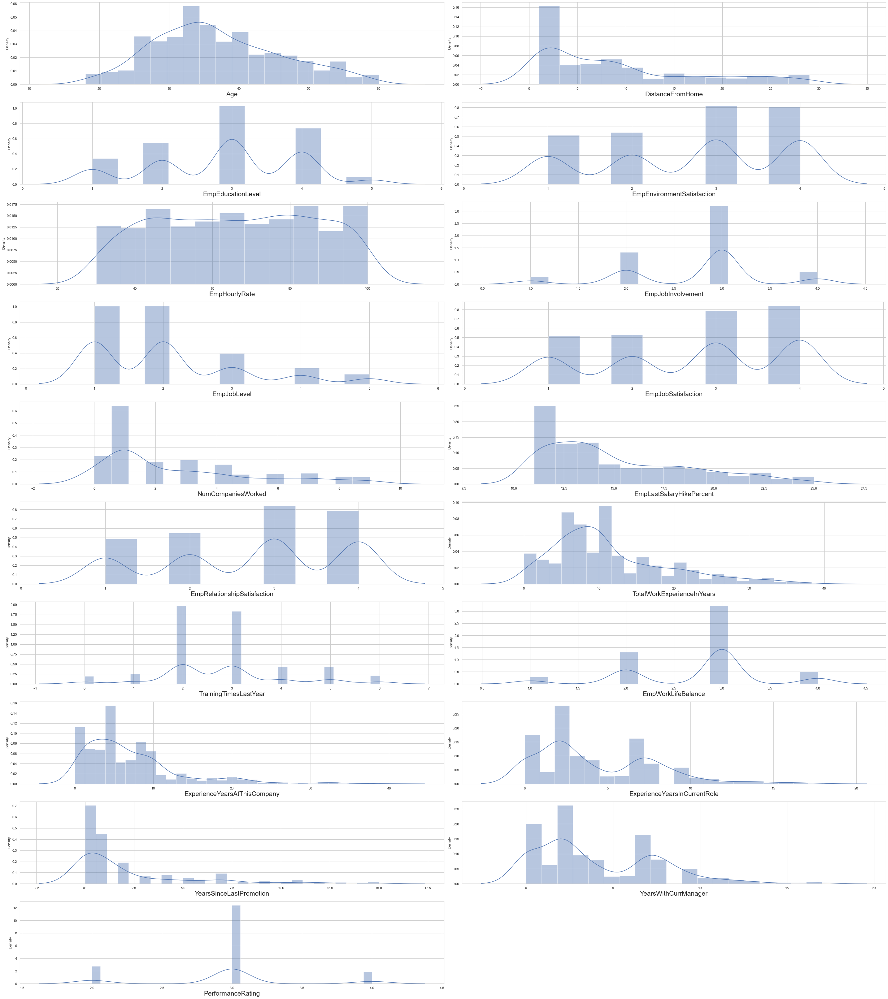

In [22]:
p = 1
sns.set_style("whitegrid")
plt.figure(figsize=(40,45))
for i in numerical:
    plt.subplot(10,2,p)                            # data is not normally distributions
    sns.distplot(data[i])
    plt.xlabel(i,fontsize=21)
    p=p+1
    plt.tight_layout()
plt.show()

* From these graphs it clearly shows data is not normally distributed.

In [23]:
# Categorical boolean mask
categorical = data.dtypes==object
# filter categorical columns using mask and turn it into a list
categorical_cols = data.columns[categorical].tolist()
categorical_cols

['Gender',
 'EducationBackground',
 'MaritalStatus',
 'EmpDepartment',
 'EmpJobRole',
 'BusinessTravelFrequency',
 'OverTime',
 'Attrition']

In [24]:
categorical = []

for col, value in data.iteritems():
    if value.dtype == 'object':
        numerical.append(col)

In [25]:
print(categorical_cols) #List of objecttype(Categorical columns)

['Gender', 'EducationBackground', 'MaritalStatus', 'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency', 'OverTime', 'Attrition']


In [26]:
categorical_cols

['Gender',
 'EducationBackground',
 'MaritalStatus',
 'EmpDepartment',
 'EmpJobRole',
 'BusinessTravelFrequency',
 'OverTime',
 'Attrition']

### Exploratory Data Analysis

Using automated plotting library sweetviz

                                             |                                             | [  0%]   00:00 ->…


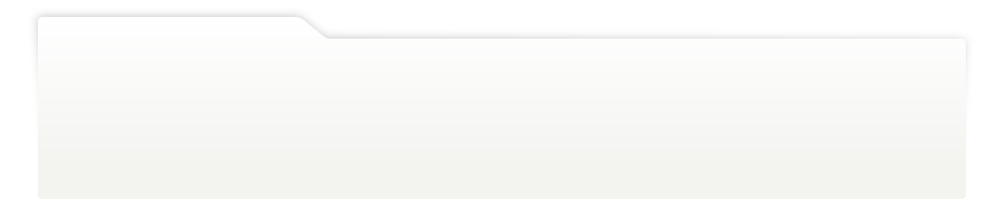
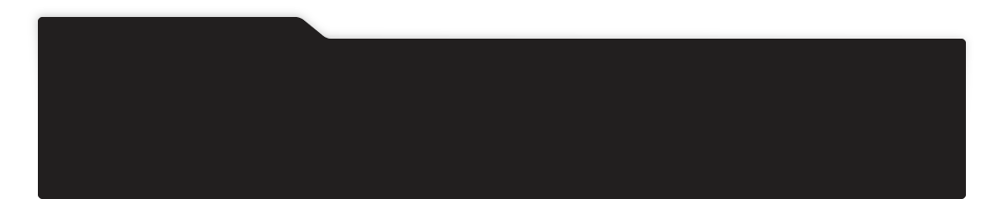
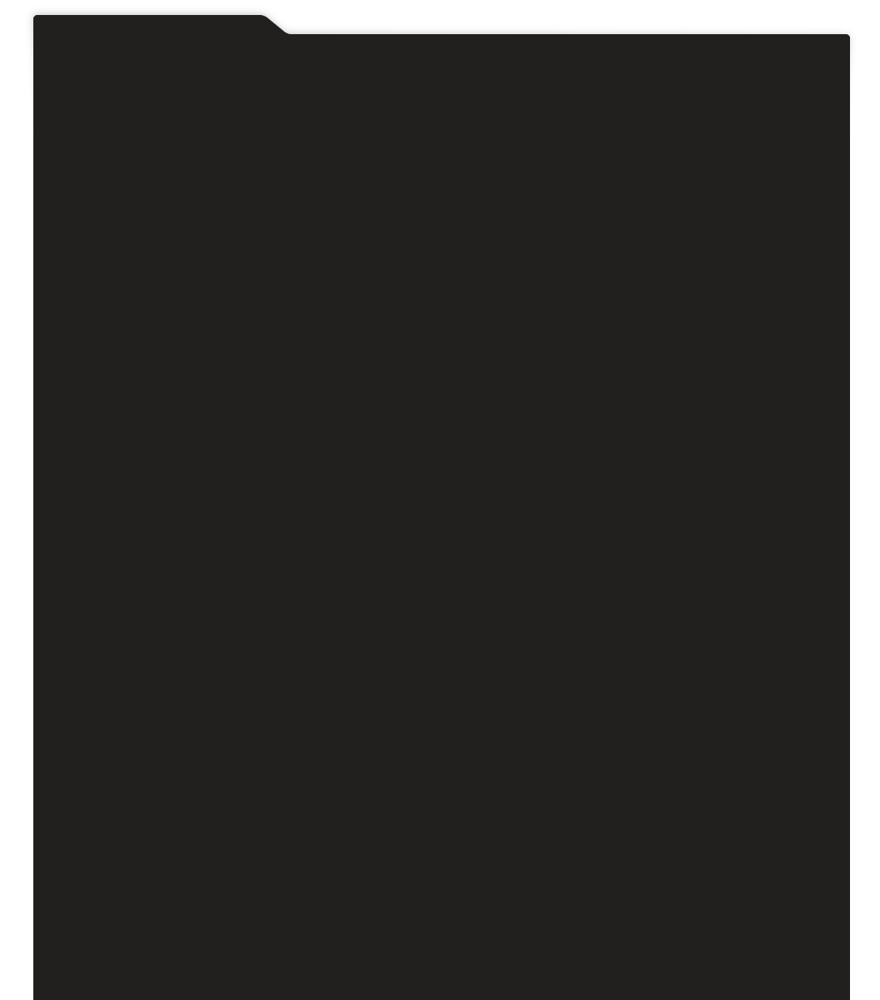
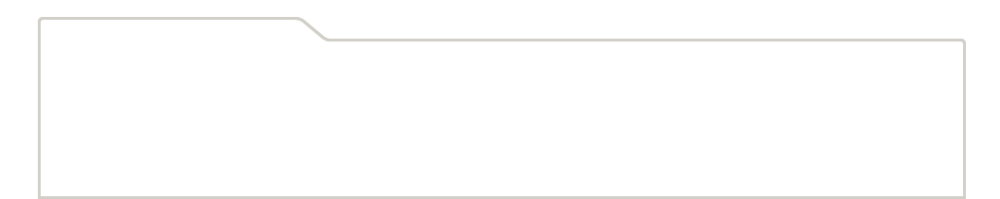
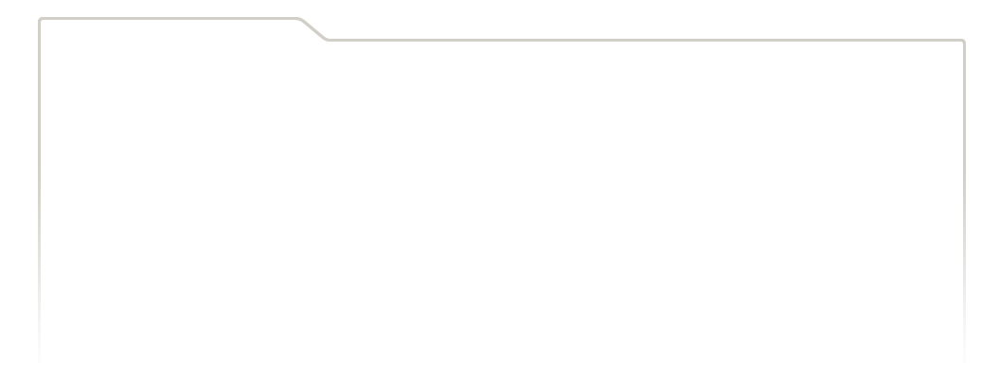
...
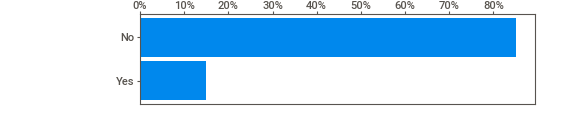
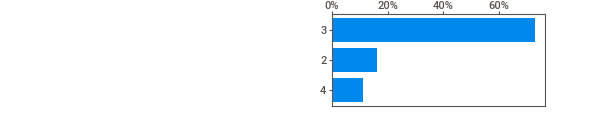
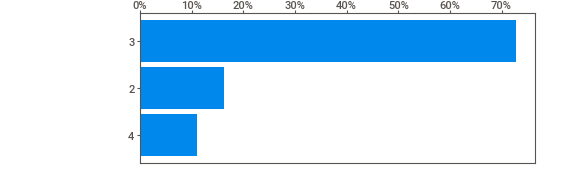
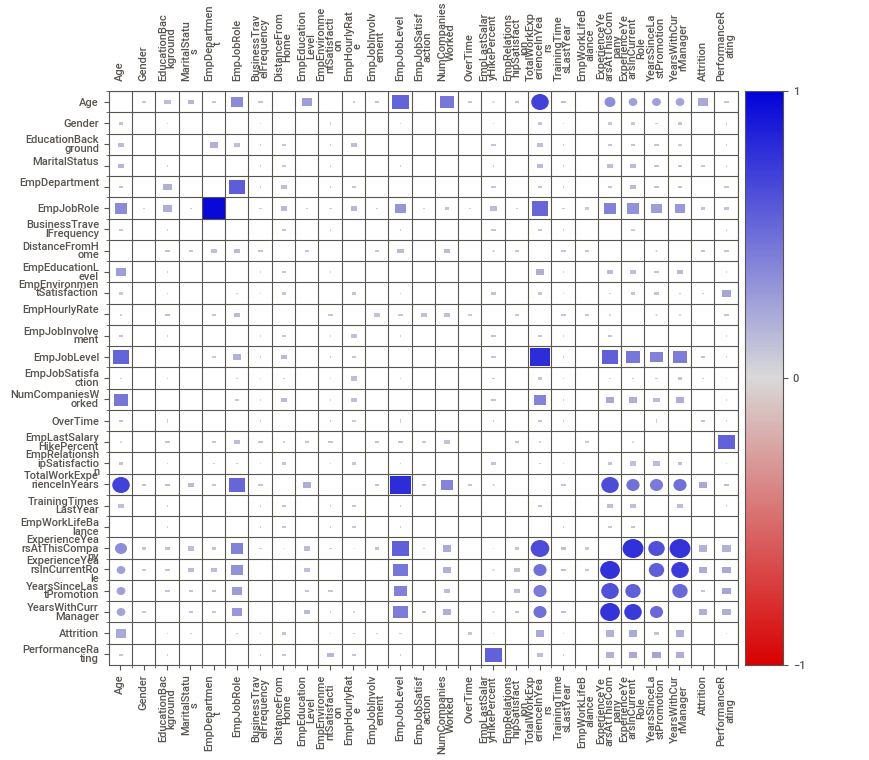
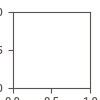

In [27]:
# Perform EDA using Sweetviz
report = sv.analyze(data)

# Display the EDA report in the Jupyter Notebook or JupyterLab interface
report.show_notebook()
# sweetviz has a classical and detailed plot of all the objectype and numerial variables

,No. of employees departmentwise
Sales,373
Development,361
Research & Development,343
Human Resources,54
Finance,49
Data Science,20


<AxesSubplot:>

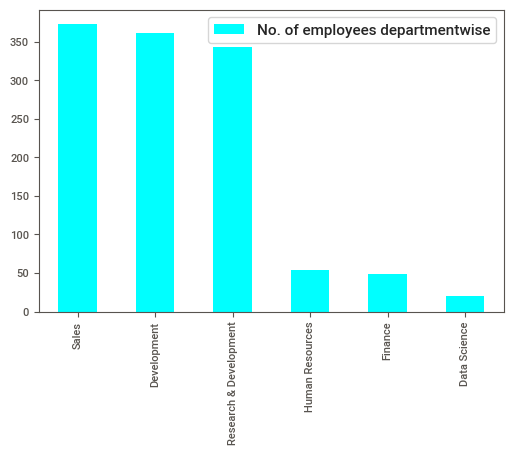

In [28]:
display(data['EmpDepartment'].value_counts().to_frame('No. of employees departmentwise'))
display(data['EmpDepartment'].value_counts().to_frame('No. of employees departmentwise').plot(kind='bar', color = 'cyan'))

* From the above plot the 3 greatest number of employees are in the respective departments: Sales,Developement and Reserch
in order of rank

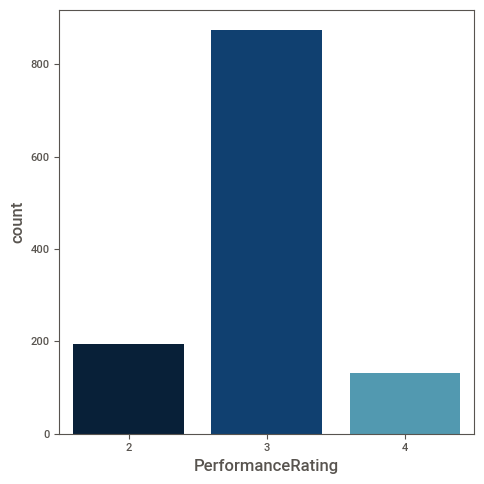

In [29]:
plt.rcParams['figure.figsize'] = (5,5)
sns.countplot(x=data['PerformanceRating'],palette = 'ocean')
plt.tight_layout()

* Majority of the employees received a rating of 3 followed by 2,then 4

In [30]:
# Bivariate analysis

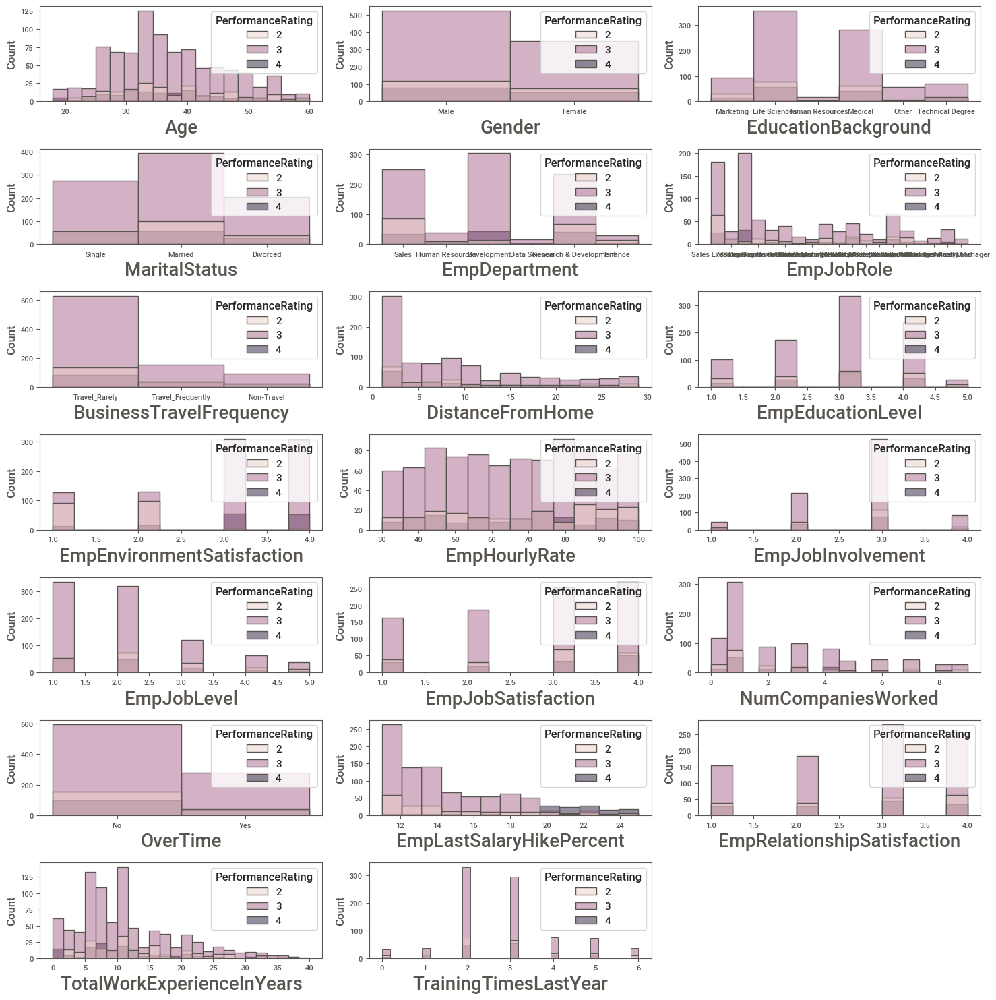

In [31]:
#This shows the relationship of all the individual variables with the target(PerformanceRating)
fig = plt.figure(figsize = (15,15))
plotnumber = 1
for column in data.columns[:-7]:
    plt.subplot(7,3,plotnumber)
    sns.histplot(x = column, data = data, hue = data['PerformanceRating'])
    plt.xlabel(column, fontsize=20)
    plotnumber +=1
plt.tight_layout()

In [32]:
#Multivariate Analysis

In [33]:
data.corr() # checking the association between variables

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
Age,1.000000,0.020937,0.207313,0.013814,0.062867,0.027216,0.509139,-0.002436,0.284408,-0.006105,0.049749,0.680886,-0.016053,-0.019563,0.318852,0.217163,0.228199,0.205098,-0.040164
DistanceFromHome,0.020937,1.000000,0.045856,-0.017719,0.013730,0.003231,0.017270,-0.003036,-0.021411,0.044974,-0.009509,0.027306,-0.032082,-0.044788,0.021908,0.019898,0.013246,0.017860,-0.046142
EmpEducationLevel,0.207313,0.045856,1.000000,-0.037103,0.014095,0.027544,0.100734,0.000357,0.128674,0.002358,-0.016690,0.151062,-0.013674,0.010276,0.076332,0.066672,0.054313,0.088988,0.020529
EmpEnvironmentSatisfaction,0.013814,-0.017719,-0.037103,1.000000,-0.049501,0.004865,-0.008272,-0.004319,0.017270,-0.047271,-0.010504,-0.012894,0.001192,-0.000262,-0.000561,0.025491,0.010732,-0.011702,0.395561
EmpHourlyRate,0.062867,0.013730,0.014095,-0.049501,1.000000,0.054741,-0.018606,-0.066417,0.040484,-0.015934,0.008783,0.026034,-0.024160,0.016189,-0.000399,-0.011871,-0.010000,-0.004576,-0.043116
EmpJobInvolvement,0.027216,0.003231,0.027544,0.004865,0.054741,1.000000,-0.034349,-0.005501,0.018211,-0.001742,0.018037,-0.028851,-0.025168,-0.014129,-0.039720,0.002910,-0.019944,0.012924,-0.010539
EmpJobLevel,0.509139,0.017270,0.100734,-0.008272,-0.018606,-0.034349,1.000000,-0.011853,0.127477,-0.020975,0.002992,0.784229,-0.000389,0.049218,0.540377,0.399235,0.360880,0.374872,-0.076632
EmpJobSatisfaction,-0.002436,-0.003036,0.000357,-0.004319,-0.066417,-0.005501,-0.011853,1.000000,-0.049865,0.031847,-0.022028,-0.026824,-0.028031,-0.018548,0.001807,0.002018,-0.006508,-0.022096,0.000606
NumCompaniesWorked,0.284408,-0.021411,0.128674,0.017270,0.040484,0.018211,0.127477,-0.049865,1.000000,-0.011788,0.057917,0.221505,-0.050817,0.002489,-0.129797,-0.097271,-0.031656,-0.109937,0.020980
EmpLastSalaryHikePercent,-0.006105,0.044974,0.002358,-0.047271,-0.015934,-0.001742,-0.020975,0.031847,-0.011788,1.000000,-0.042892,-0.005933,-0.013439,-0.017001,-0.019830,-0.004957,-0.015911,-0.007666,0.333722


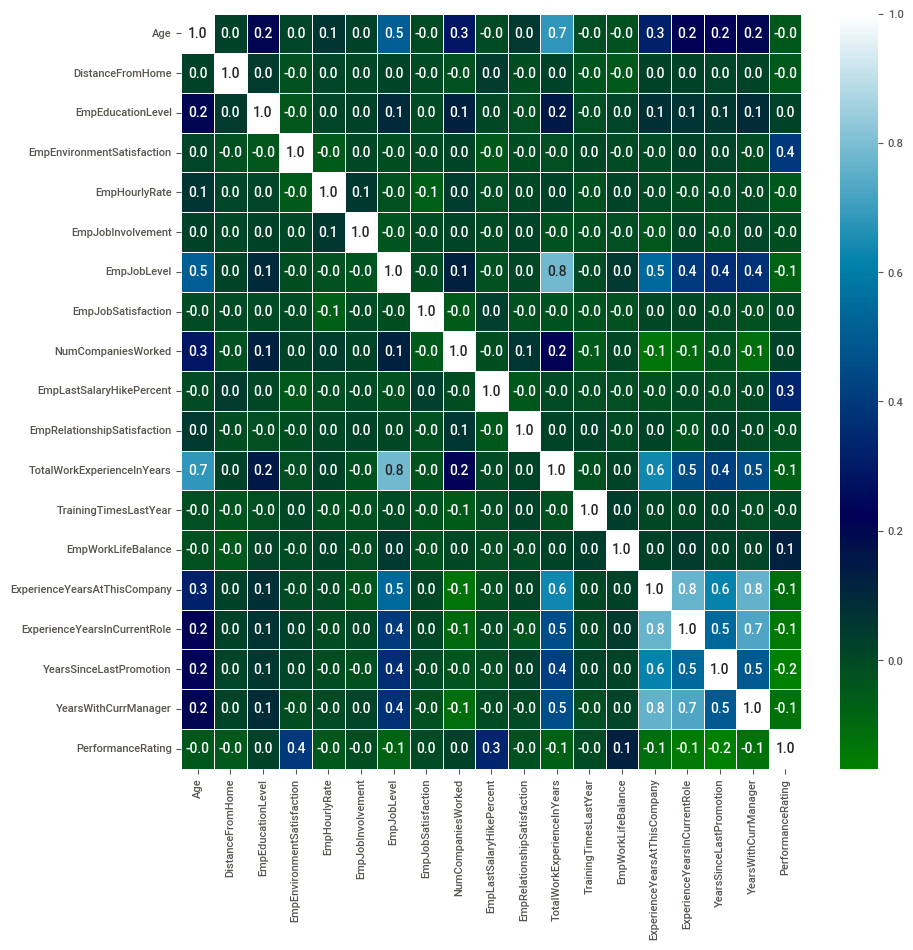

In [34]:
plt.rcParams['figure.figsize'] =(10,10)
sns.heatmap(data.corr(), annot=True, cmap="ocean", annot_kws={"size":10},linewidths=.5, fmt= '.1f')
plt.show()

* Variables with high correlation expressed a correlation Coefficien >0.8 approaching 1 and nergative values are oppositly
  correlated like EmpJobLevel and Work Experience in Years,Experience at Company and Employment Current Role



# TASK1. Department wise performances

###  FIRST APPROACH

In [35]:
data.pivot_table(index='EmpDepartment',values='PerformanceRating',aggfunc='mean').reset_index().rename(columns={'PerformanceRating':'Average performancerating'})

,EmpDepartment,Average performancerating
0,Data Science,3.050000
1,Development,3.085873
2,Finance,2.775510
3,Human Resources,2.925926
4,Research & Development,2.921283
5,Sales,2.860590


* COMMENT: The above shows the performance rating of Different Departments the heighest was the Developement,followed by 
  datascience then Human Resources.

### Second approach using plotting method

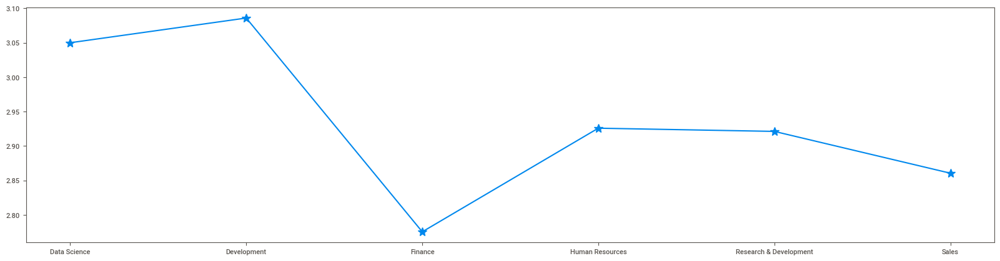

In [36]:
plt.figure(figsize=(20,5))
x=dep_per=data.groupby(data['EmpDepartment']).mean().loc[:,['PerformanceRating']]
plt.plot(x,marker='*',markersize=10)

Text(0.5, 1.0, 'Perforance Rating')

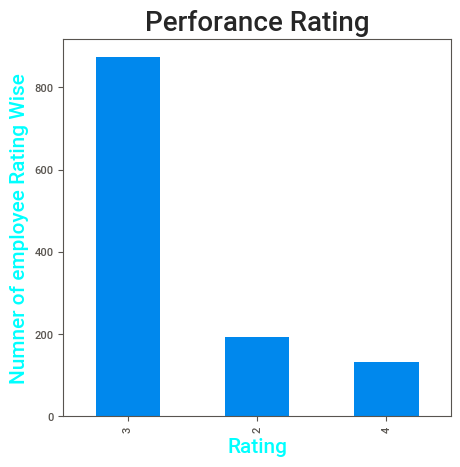

In [37]:
plt.figure(figsize = (5,5))
data.PerformanceRating.value_counts().plot(kind = 'bar')
plt.ylabel('Numner of employee Rating Wise',fontsize=15,color='cyan')
plt.xlabel('Rating',fontsize=15,color='cyan')
plt.title("Perforance Rating",fontsize=20)

### Third approach.:

In [38]:
dep_per=data.groupby(data['EmpDepartment']).mean().loc[:,['PerformanceRating']]
dep_per.sort_values(by='PerformanceRating',ascending=False)

,PerformanceRating
EmpDepartment,
Development,3.085873
Data Science,3.050000
Human Resources,2.925926
Research & Development,2.921283
Sales,2.860590
Finance,2.775510


In [39]:
#DEPARYMENTEWISE RATING.

In [40]:
data.EmpDepartment.value_counts()

Sales                     373
Development               361
Research & Development    343
Human Resources            54
Finance                    49
Data Science               20
Name: EmpDepartment, dtype: int64

# Task 2
### Top 3 Important Factors effecting employee performance
* Remark : Here i used Several methods notably methods 1,2 and 3 to arrive the best solutions 


### Method 1
*  The top 3 fatctors effecting employee performance  is determine by CORRELATION using corr().
*  correlation is not affecting  object datypes (columns),now don't need of ENCODING of CATRGORICAL.
* Correlation is a number ranged from -1 to +1 with a zero correlation meaning there is none, a correlation of 1 means there is a perfect correlation and a correlation of -1 means there is a perfect inverse correlation. 



In [41]:
#Method1
data.corr().loc['PerformanceRating'].sort_values(ascending=False)

PerformanceRating               1.000000
EmpEnvironmentSatisfaction      0.395561
EmpLastSalaryHikePercent        0.333722
EmpWorkLifeBalance              0.124429
NumCompaniesWorked              0.020980
EmpEducationLevel               0.020529
EmpJobSatisfaction              0.000606
TrainingTimesLastYear          -0.005443
EmpJobInvolvement              -0.010539
EmpRelationshipSatisfaction    -0.019502
Age                            -0.040164
EmpHourlyRate                  -0.043116
DistanceFromHome               -0.046142
TotalWorkExperienceInYears     -0.068141
EmpJobLevel                    -0.076632
ExperienceYearsAtThisCompany   -0.111645
YearsWithCurrManager           -0.122313
ExperienceYearsInCurrentRole   -0.147638
YearsSinceLastPromotion        -0.167629
Name: PerformanceRating, dtype: float64

#### Observation:
*  Above the result the Top 3 factors are :-
1. EmpEnvironmentSatisfaction (0.395561)
2. EmpLastSalaryHikePercent  ( 0.333722)
3. EmpWorkLifeBalance        (0.124429)
* Beacuse highly correlated with PerformanceRating .



### Method2 using machine LEARNING.

In [42]:
#Encoding variables to use distinctly for the second question.
encoder = LabelEncoder()

for i in data1.columns:
    if data1[i].dtype == 'object':              # label encoding (string value to numerical value)
        print(i)
        data1[i] = encoder.fit_transform(data1[i])

EmpNumber
Gender
EducationBackground
MaritalStatus
EmpDepartment
EmpJobRole
BusinessTravelFrequency
OverTime
Attrition


In [43]:
#Defining Variables to Use for ExraTrees Classifier.
X1 = data1.iloc[:,:-1]
y1 = data1.PerformanceRating       

In [44]:
#label encode before classifying

In [45]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1,y1, test_size=0.42 ,random_state=10)

In [46]:
# uning ExtraTreesClassifieries
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model=ExtraTreesClassifier()
model.fit(X_train1,y_train1)

ExtraTreesClassifier()

In [47]:
print(model.feature_importances_)

[0.03334055 0.02922014 0.02256713 0.02448685 0.02461919 0.04252383
 0.03361456 0.02390853 0.02871495 0.02847652 0.13339441 0.0296432
 0.0245474  0.0222611  0.02827476 0.02666327 0.01549823 0.14563399
 0.02455425 0.02691627 0.02565888 0.03030229 0.02837632 0.03899448
 0.06376712 0.03199096 0.01205084]


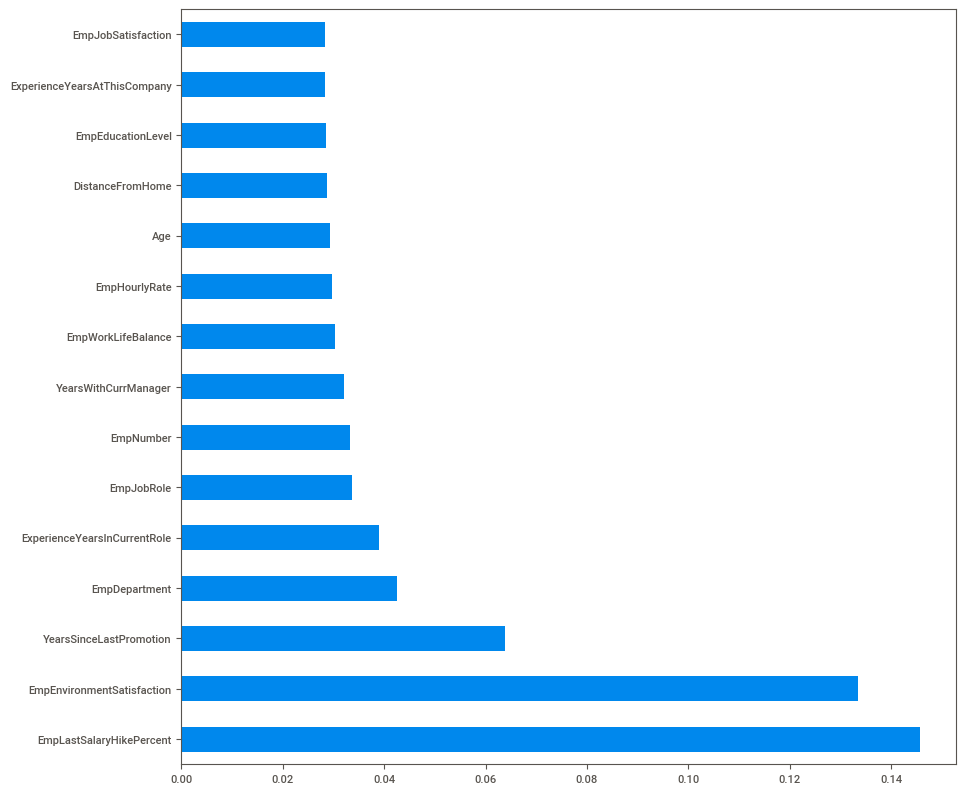

In [48]:
ranked_features=pd.Series(model.feature_importances_,index=X_train1.columns)
ranked_features.nlargest(15).plot(kind='barh')
plt.show()

### Method 3  the best and most ccurate results were obtained by this method,thus the results will be of Choice.

In [49]:
encoder = LabelEncoder()

for i in data1.columns:
    if data1[i].dtype == 'object':              # label encoding (string value to numerical value)
        print(i)
        data1[i] = encoder.fit_transform(data1[i])

In [50]:
X1 = data1.iloc[:,:-1]
y1 = data1.PerformanceRating                    # spliting the target values and predictor values

In [51]:
X1.head(3)

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,0,32,1,2,2,5,13,2,10,3,4,55,3,2,4,1,0,12,4,10,2,2,10,7,0,8,0
1,1,47,1,2,2,5,13,2,14,4,4,42,3,2,1,2,0,12,4,20,2,3,7,7,1,7,0
2,2,40,1,1,1,5,13,1,5,4,4,48,2,3,1,5,1,21,3,20,2,3,18,13,1,12,0


In [52]:
pd.DataFrame(y1.head(3))

,PerformanceRating
0,3
1,3
2,4


In [53]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1,y1, train_size= 0.75,random_state=0)


In [54]:
 # the data not much skew dur to that we are using the SMOTE technique
    
oversampler= SMOTE(random_state=0)   
smote_train, smote_target = oversampler.fit_resample(X1,y1)

In [55]:
seed = 0   # We set our random seed to zero for reproducibility
# Random Forest parameters
rf_params = {
    'n_jobs': -1,
    'n_estimators': 800,
    'warm_start': True, 
    'max_features': 0.3,
    'max_depth': 9,
    'min_samples_leaf': 2,
    'max_features' : 'sqrt',
    'random_state' : seed,
    'verbose': 0
}

rf = RandomForestClassifier(**rf_params)
rf.fit(smote_train, smote_target)
rf_predictions = rf.predict(X_test1)

In [56]:
rf.feature_importances_

array([0.03949428, 0.01218492, 0.00487929, 0.00927588, 0.01003483,
       0.04138029, 0.04072044, 0.01665805, 0.01364481, 0.01269633,
       0.22727296, 0.01888686, 0.00887633, 0.0073101 , 0.00830376,
       0.00845895, 0.02378526, 0.26262344, 0.01245363, 0.01332047,
       0.01182923, 0.01720469, 0.01974814, 0.04086938, 0.09738612,
       0.01766238, 0.00303918])

In [57]:

# Initialize and train the random forest model
model = RandomForestClassifier()
model.fit(X_train1, y_train1)

# Get feature importances
importances = model.feature_importances_

# Get feature names from the dataset
feature_names = X_train1.columns

# Create a DataFrame to store feature importances
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort the DataFrame by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Select the top 3 important features
top_features = importance_df.head(3)
# Custom color
lemon_green = '#CDDC39'


# Create a bar plot of feature importances using Plotly
fig = go.Figure(data=go.Bar(x=top_features['Feature'], y=top_features['Importance']))
fig.update_layout(title='Top 3 Important Factors Affecting Employee Performance',
                  xaxis_title='Feature',
                  yaxis_title='Importance')

# Show the plot
fig.show(renderer="notebook")

In [58]:

# Initialize and train the random forest model
model = RandomForestClassifier()
model.fit(X_train1, y_train1)

# Get feature importances
importances = model.feature_importances_

# Get feature names from the dataset
feature_names = X_train1.columns

# Create a DataFrame to store feature importances
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort the DataFrame by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Select the top 3 important features
top_features = importance_df.head(3)

# Custom color
lemon_green = '#CDDC39'

# Create a bar plot of feature importances using Plotly
fig = go.Figure(data=go.Bar(x=top_features['Feature'], y=top_features['Importance'], 
                           marker=dict(color=lemon_green)))

# Customize layout properties
fig.update_layout(
    title='Top 3 Important Factors Affecting Employee Performance',
    xaxis_title='Feature',
    yaxis_title='Importance',
    plot_bgcolor='white',
    font=dict(
        family='Arial',
        color='black',
        size=14
    )
)

# Customize bar colors
fig.update_traces(marker_color=lemon_green, marker_line_color='black', marker_line_width=1)

# Show the plot
fig.show(renderer = 'notebook')

###  The 3 top factor which are affecting the INX Future comapany:-

* Employees Evniroment satisfaction.
* Employees salary hike.
* Employees promotions

# Task 3 building an ML model for dataset Parediction.

## Feature Engineering
* Statistical tests can be used to select those features that have the strongest relationship with the output variable.
* The scikit-learn library provides the SelectKBest class that can be used with a suite of different statistical tests to select a specific number of features.

#### STAISTISTICAL  FEATURE SELECTION TECHNIQUE USING "Random Forest Feature Importance"

Random Forest feature importance is a feature selection technique that utilizes the Random Forest algorithm to determine the importance or relevance of each input feature in a dataset. It provides a ranking of features based on their contribution to the predictive performance of the Random Forest model.

In [59]:
#USING Probability Sampling Technique.
X1 = data1.iloc[:,:-1]  #independent columns
y1=data.PerformanceRating
#target column 
#apply SelectKBest class to extract top 10 best features
best_features = SelectKBest(score_func=chi2, k=10)
fit = best_features.fit(X1,y1)
scores = pd.DataFrame(fit.scores_)
columns = pd.DataFrame(data1.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([columns,scores],axis=1)
featureScores.columns = ['best_feature','score']  #naming the dataframe columns
print(featureScores.nlargest(10,'score'))  #print 7 best feature

                    best_feature       score
17      EmpLastSalaryHikePercent  297.136917
24       YearsSinceLastPromotion  238.004284
22  ExperienceYearsAtThisCompany  133.602068
23  ExperienceYearsInCurrentRole  120.860036
10    EmpEnvironmentSatisfaction  110.691319
25          YearsWithCurrManager   87.483471
5                  EmpDepartment   46.787010
19    TotalWorkExperienceInYears   41.593037
6                     EmpJobRole   35.896167
8               DistanceFromHome   18.650010


In [60]:
#See the data frame of  Best featue and thair score.
featureScores.sort_values(by='score',ascending=False).head(8)

,best_feature,score
17,EmpLastSalaryHikePercent,297.136917
24,YearsSinceLastPromotion,238.004284
22,ExperienceYearsAtThisCompany,133.602068
23,ExperienceYearsInCurrentRole,120.860036
10,EmpEnvironmentSatisfaction,110.691319
25,YearsWithCurrManager,87.483471
5,EmpDepartment,46.787010
19,TotalWorkExperienceInYears,41.593037


In [61]:
#Use 10 best feature in the 'x1' variable and convert into list.

In [62]:
X1=(featureScores.nlargest(10,'score')).iloc[:,0].tolist()
X1

['EmpLastSalaryHikePercent',
 'YearsSinceLastPromotion',
 'ExperienceYearsAtThisCompany',
 'ExperienceYearsInCurrentRole',
 'EmpEnvironmentSatisfaction',
 'YearsWithCurrManager',
 'EmpDepartment',
 'TotalWorkExperienceInYears',
 'EmpJobRole',
 'DistanceFromHome']

### Dividing the dataset into training and test dataset
* After having analyzed the dataset, we shall divide the entire dataset into training and test set using train_test_split in the ratio 70:30 It uses random sorting.


In [63]:
X1=data1.loc[:,X1] #Updating input variable with Best Feature
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1,y1, test_size=0.10 ,random_state=10)

In [64]:
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1,y1,test_size=0.10,random_state=10)
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(max_depth=5,random_state=1,n_estimators=25)
model.fit(X_train1,y_train1)
y_predict = model.predict(X_test1)
print(accuracy_score(y_test1, y_predict))

0.9416666666666667


In [65]:
print(classification_report(y_test1,y_predict))

              precision    recall  f1-score   support

           2       0.90      0.90      0.90        20
           3       0.96      0.97      0.96        90
           4       0.89      0.80      0.84        10

    accuracy                           0.94       120
   macro avg       0.91      0.89      0.90       120
weighted avg       0.94      0.94      0.94       120



#Observations

In [66]:
from sklearn.metrics import confusion_matrix

Text(99.72222222222221, 0.5, 'Actual_Rating')

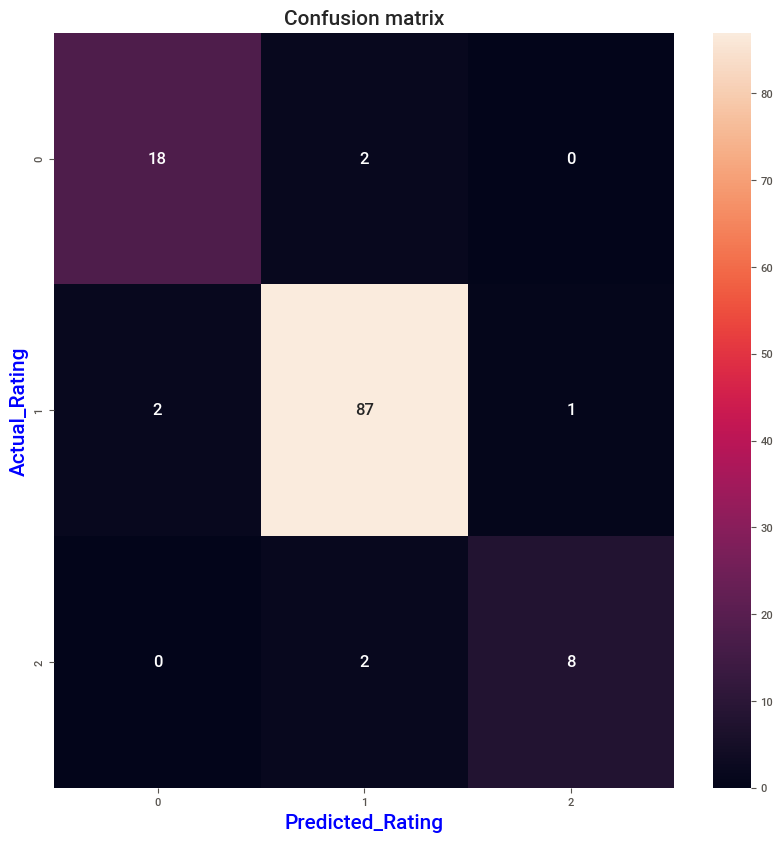

In [67]:
sns.heatmap(confusion_matrix(y_test1,y_predict),annot=True)
plt.title('Confusion matrix',fontsize=15)
plt.xlabel('Predicted_Rating',fontsize=15,color='blue')
plt.ylabel('Actual_Rating',fontsize=15,color='blue')


### Using the conventional method for machine learnning on normal algorithm

In [68]:
##FEATURE ENGINEERING

In [69]:
data2.head()
data3.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,55,3,2,4,1,No,12,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,42,3,2,1,2,No,12,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,48,2,3,1,5,Yes,21,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,2,73,2,5,4,3,No,15,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,1,84,3,2,1,8,No,14,4,10,1,3,2,2,2,2,No,3


* Encoding Categorical Variables.
In machine learning (ML), encoding refers to the process of transforming categorical or textual data into numerical representations that can be used as input for ML algorithms. Since most ML algorithms operate on numerical data, encoding is necessary to handle categorical variables or text-based features in a meaningful way.

In [70]:
#Using label encoder  for data3
encoder = LabelEncoder()

for i in data2.columns:
    if data2[i].dtype == 'object':              # label encoding (string value to numerical value)
        print(i)
        data2[i] = encoder.fit_transform(data2[i])

EmpNumber
Gender
EducationBackground
MaritalStatus
EmpDepartment
EmpJobRole
BusinessTravelFrequency
OverTime
Attrition


* YOU wil notice i had different train and test sets drawn from different data because i was trying which will give the mostapproriate and accurate results,so it wont be uncommon to find mant train and test sets from several X and Y

In [71]:
X2 = data2.iloc[:,:-1]
y2 = data2.PerformanceRating                    # spliting the target values and predictor values

In [72]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2,y2, test_size= 0.25,random_state=42)


* SMOTE" (Synthetic Minority Over-sampling Technique), which is a technique used in machine learning for addressing class imbalance in a dataset.

In [73]:
#Smoting2
from imblearn.over_sampling import SMOTE
sm=SMOTE(sampling_strategy="minority") 
X_smote2,y_smote2=sm.fit_resample(X_train2,y_train2)

In [74]:
# From the given data, these features will be used for modelling
X=data3[['Age','DistanceFromHome','EmpEducationLevel','EmpEnvironmentSatisfaction','EmpHourlyRate','EmpJobInvolvement',
      'EmpJobLevel','EmpJobSatisfaction','NumCompaniesWorked','EmpLastSalaryHikePercent','EmpRelationshipSatisfaction',
      'TotalWorkExperienceInYears','TrainingTimesLastYear','EmpWorkLifeBalance','ExperienceYearsAtThisCompany',
      'ExperienceYearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager','Gender','EducationBackground',
      'MaritalStatus','EmpDepartment','BusinessTravelFrequency','OverTime','Attrition']]
y=data3['PerformanceRating']

In [75]:
column_names=list(['Age','DistanceFromHome','EmpEducationLevel','EmpEnvironmentSatisfaction','EmpHourlyRate','EmpJobInvolvement',
      'EmpJobLevel','EmpJobSatisfaction','NumCompaniesWorked','EmpLastSalaryHikePercent','EmpRelationshipSatisfaction',
      'TotalWorkExperienceInYears','TrainingTimesLastYear','EmpWorkLifeBalance','ExperienceYearsAtThisCompany',
      'ExperienceYearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager','Gender','EducationBackground',
      'MaritalStatus','EmpDepartment','BusinessTravelFrequency','OverTime','Attrition','transformed_a','transformed_b',
      'transformed_c','transformed_d','transformed_e','transformed_f','transformed_g','transformed_h','transformed_i'])

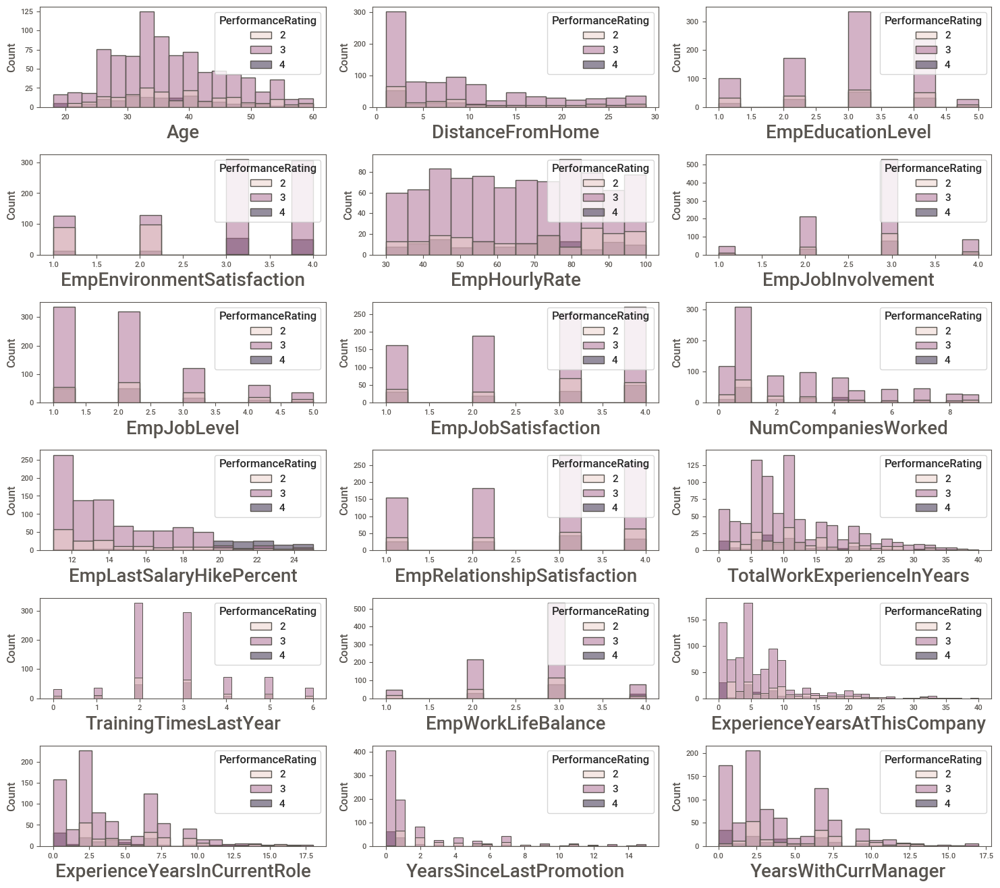

In [76]:
fig = plt.figure(figsize = (15,15))
plotnumber = 1
for column in X.columns[:-7]:
    plt.subplot(7,3,plotnumber)
    sns.histplot(x = column, data = X, hue = data3['PerformanceRating'])
    plt.xlabel(column, fontsize=20)
    plotnumber +=1
plt.tight_layout()

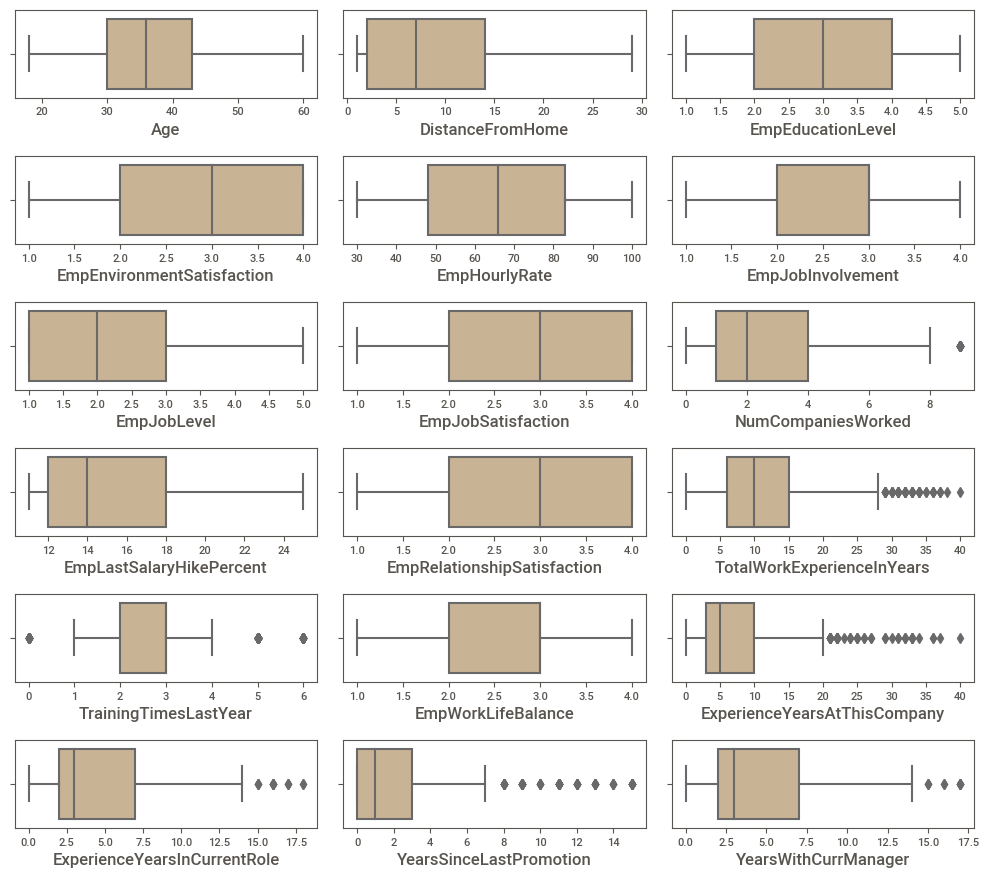

In [77]:
fig = plt.figure(figsize=(10,10))
plotnumber = 1
for column in X.columns[:-7]:
    plt.subplot(7,3,plotnumber)
    sns.boxplot(x = column,data=X,color = 'tan')
    plt.xlabel(column, fontsize=12)
    plotnumber += 1
plt.tight_layout()

In [78]:
## Outliers are not being removed in this project as these information are important for prediction. However after transforming there are no outliers.

In [79]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=3)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(900, 25)
(900,)
(300, 25)
(300,)


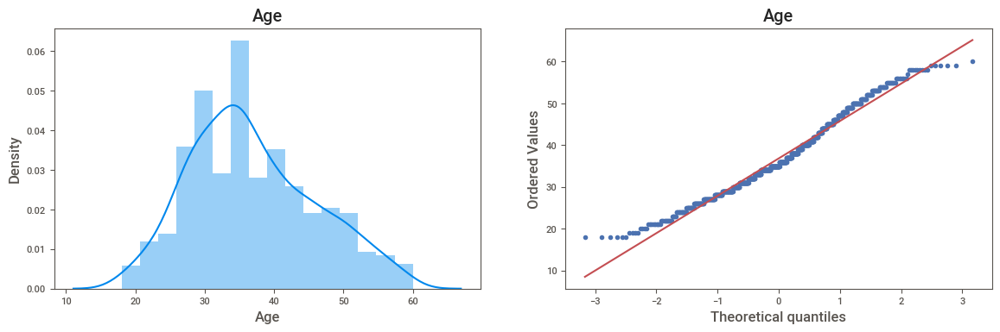

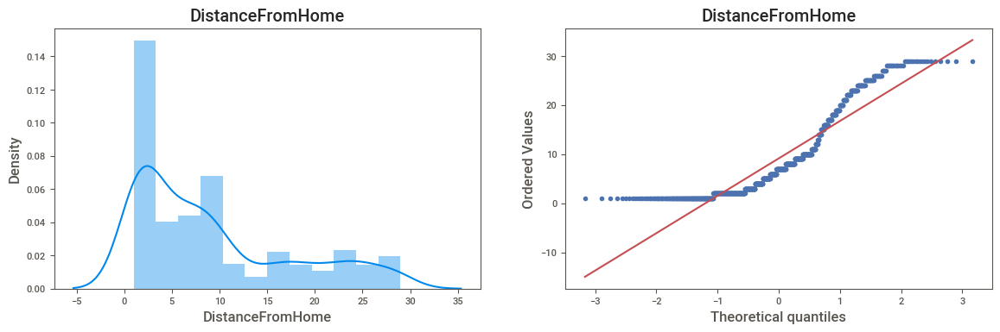

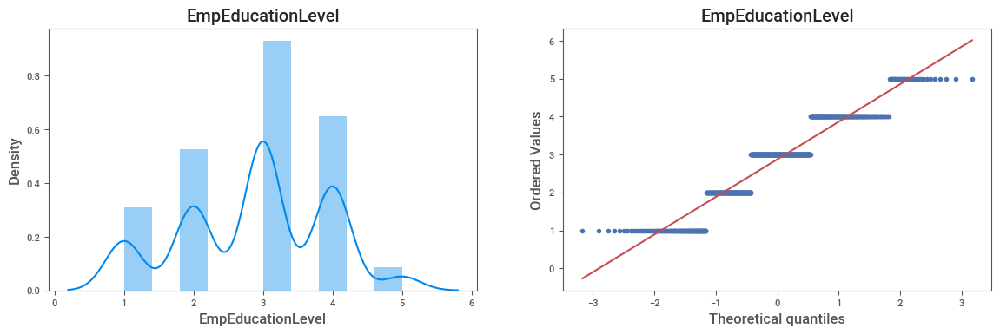

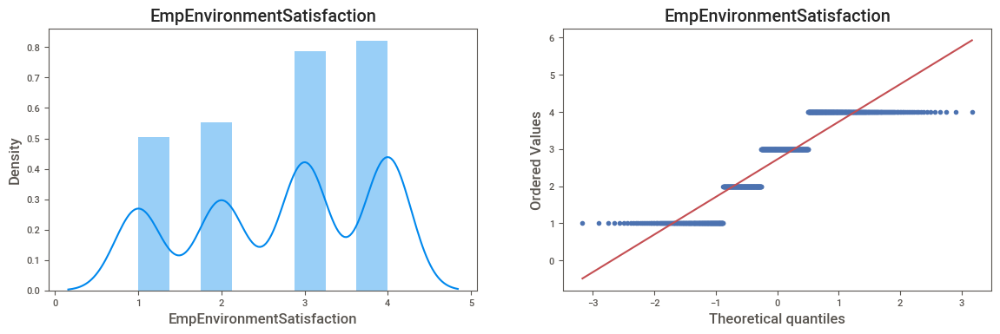

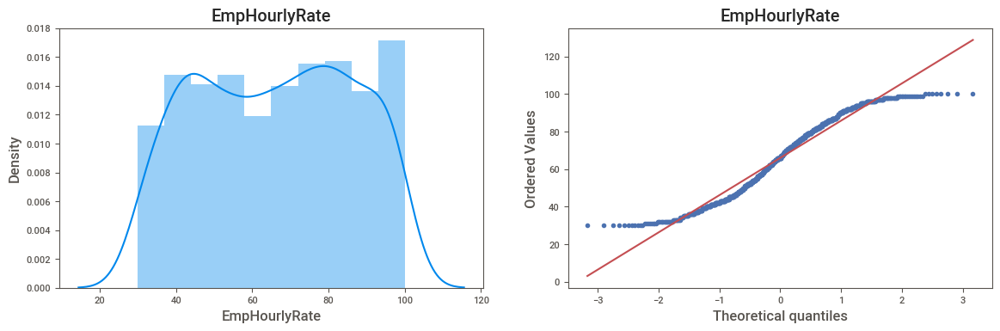

...

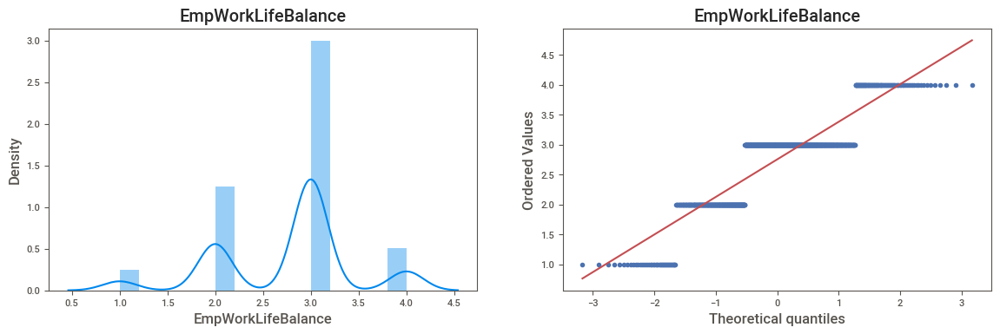

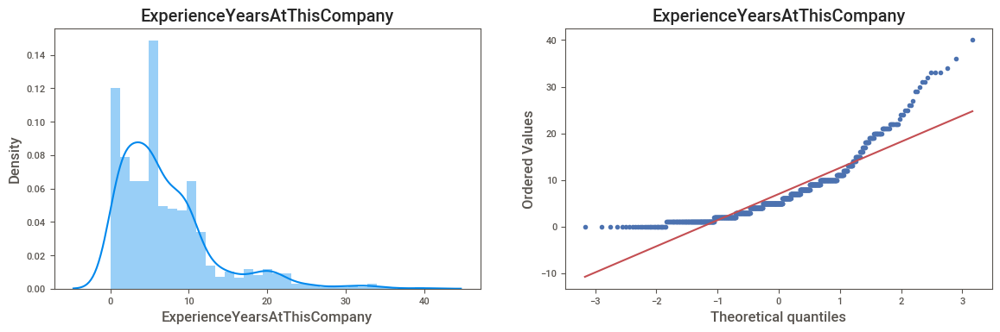

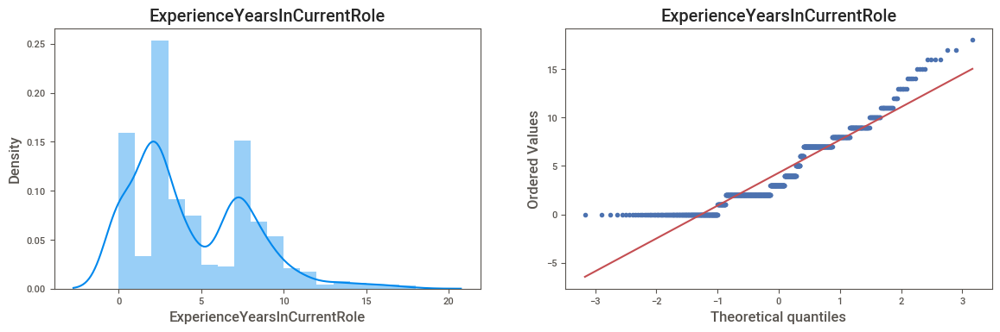

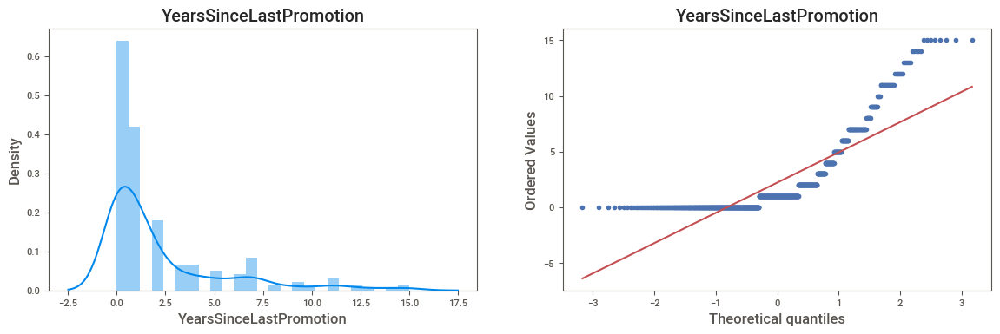

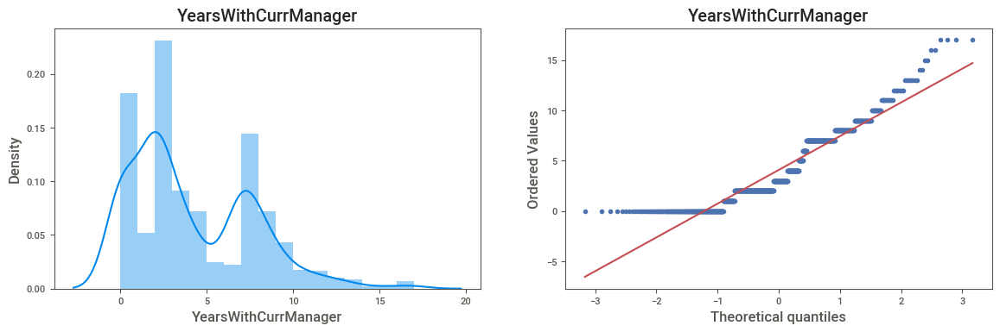

In [80]:
for col in X_train.columns[:-7]:
    plt.figure(figsize=(14,4))
    plt.subplot(121)
    sns.distplot(X_train[col])
    plt.title(col)
    
    plt.subplot(122)
    stats.probplot(X_train[col], dist='norm', plot=plt)
    plt.title(col)
    
    plt.show()

* This plot shows that some variables are not noramlly distributed so we will try Scaling with Standard Scaler and Check the behavior and mae Comparism of the varoius accuracies in both Cases.

In [81]:
### Transforming categorical features using column tarnsformer 

In [82]:
column_names=list(['Age','DistanceFromHome','EmpEducationLevel','EmpEnvironmentSatisfaction','EmpHourlyRate','EmpJobInvolvement',
      'EmpJobLevel','EmpJobSatisfaction','NumCompaniesWorked','EmpLastSalaryHikePercent','EmpRelationshipSatisfaction',
      'TotalWorkExperienceInYears','TrainingTimesLastYear','EmpWorkLifeBalance','ExperienceYearsAtThisCompany',
      'ExperienceYearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager','BusinessTravelFrequency','Attrition',
      'Gender_Female','Medical','Marketing','TechnicalDegree','Other','HumanResources','Single','Divorced','Development',
      'Research&Development','HumanResources','Finance','Datascience','Overtime_Yes'])

In [83]:
transformer = ColumnTransformer(transformers=[
    ('tnf1',OrdinalEncoder(categories=[['Non-Travel','Travel_Rarely','Travel_Frequently']]),['BusinessTravelFrequency']),
    ('tnf2',OrdinalEncoder(categories=[['No','Yes']]),['Attrition']),
    ('tnf3',OneHotEncoder(sparse=False,drop='first',dtype=np.int32),['Gender','EducationBackground','MaritalStatus','EmpDepartment','OverTime'])
],remainder='passthrough')

In [84]:
X_traintnf=transformer.fit_transform(X_train)

In [85]:
X_testtnf=transformer.transform(X_test)

In [86]:
X_traintnf.shape

(900, 34)

In [87]:
X_testtnf.shape

(300, 34)

In [88]:
from sklearn.preprocessing import StandardScaler

In [89]:
transformer = PowerTransformer()
X_train_scaled = transformer.fit_transform(X_traintnf)
x_test_scaled = transformer.transform(X_testtnf)
X_train_scaled_df = pd.DataFrame(X_train_scaled,columns=column_names)
X_train_scaled_df.head()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravelFrequency,Attrition,Gender_Female,Medical,Marketing,TechnicalDegree,Other,HumanResources,Single,Divorced,Development,Research&Development,HumanResources,Finance,Datascience,Overtime_Yes
0,-0.147344,-0.412736,-1.250641,-0.862662,2.877212,-0.680746,-0.237356,-0.301511,1.085899,-0.680746,-0.668540,-0.215666,-0.195096,-0.646005,1.527525,-0.644278,1.209086,-1.010932,2.142329,-0.701834,-1.456810,0.323215,0.263188,1.195706,-0.005717,-0.127480,-1.544105,0.545631,-0.558680,0.297672,0.629771,0.867861,1.357693,0.921284
1,1.716386,2.422856,-1.250641,1.159202,-0.347559,-0.680746,-0.237356,-0.301511,-0.920896,-0.680746,1.495797,-0.215666,-0.195096,-0.646005,-0.654654,1.552125,-0.116499,1.491252,1.096296,1.204053,1.450161,0.323215,-1.157624,-0.706668,-0.621870,1.121626,-1.544105,0.047789,0.243439,-1.103986,0.763929,-0.490076,1.450271,1.103262
2,-0.147344,-0.412736,-1.250641,1.159202,-0.347559,-0.680746,-0.237356,-0.301511,-0.920896,-0.680746,1.495797,-0.215666,-0.195096,-0.646005,-0.654654,-0.644278,0.108804,0.862617,0.094298,1.204053,1.404251,0.323215,-1.157624,-1.513340,-0.621870,-0.951527,0.189386,0.958402,-0.558680,-1.103986,1.562157,0.867861,1.735904,2.291026
3,-0.147344,-0.412736,0.799590,1.159202,-0.347559,-0.680746,-0.237356,-0.301511,-0.920896,1.468977,-0.668540,-0.215666,-0.195096,-0.646005,1.527525,1.552125,-0.002698,-1.010932,1.096296,0.212824,0.225672,0.323215,-1.157624,1.195706,0.420297,1.440535,1.202858,-0.416117,0.243439,-1.103986,-0.587975,-0.490076,0.071860,-0.401303
4,-2.047698,-0.412736,-1.250641,-0.862662,-0.347559,1.468977,-0.237356,-0.301511,1.085899,-0.680746,1.495797,-0.215666,-0.195096,-0.646005,-0.654654,1.552125,0.108804,1.491252,2.142329,-0.701834,0.322398,0.323215,0.263188,0.202269,0.420297,0.195769,-1.544105,0.655353,-0.558680,0.297672,1.109998,1.552374,1.645933,0.921284


In [90]:
scaled = StandardScaler()
X_train_scaled = scaled.fit_transform(X_traintnf)
X_test_scaled=  scaled.transform(X_testtnf)
X_train_scaled_df = pd.DataFrame(X_train_scaled,columns=column_names)
X_train_scaled_df.head()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravelFrequency,Attrition,Gender_Female,Medical,Marketing,TechnicalDegree,Other,HumanResources,Single,Divorced,Development,Research&Development,HumanResources,Finance,Datascience,Overtime_Yes
0,-0.152358,-0.412736,-1.250641,-0.862662,2.877212,-0.680746,-0.237356,-0.301511,1.085899,-0.680746,-0.668540,-0.215666,-0.195096,-0.646005,1.527525,-0.644278,1.239336,-0.867409,2.042935,-0.660964,-1.428839,0.378611,-0.043356,1.157703,-0.318552,-0.330560,-1.609771,0.354464,-0.598155,0.351699,0.330751,0.762136,1.174758,0.827435
1,1.726025,2.422856,-1.250641,1.159202,-0.347559,-0.680746,-0.237356,-0.301511,-0.920896,-0.680746,1.495797,-0.215666,-0.195096,-0.646005,-0.654654,1.552125,-0.203043,1.930685,1.082809,1.169397,1.484024,0.378611,-0.950804,-0.660679,-0.707556,1.053180,-1.609771,-0.164686,0.190043,-1.080560,0.494850,-0.644019,1.484993,1.111127
2,-0.152358,-0.412736,-1.250641,1.159202,-0.347559,-0.680746,-0.237356,-0.301511,-0.920896,-0.680746,1.495797,-0.215666,-0.195096,-0.646005,-0.654654,-0.644278,0.018862,0.592466,0.122683,1.169397,1.434654,0.378611,-0.950804,-1.569870,-0.707556,-0.884056,0.238180,0.873614,-0.598155,-1.080560,1.807644,0.762136,3.036170,3.664354
3,-0.152358,-0.412736,0.799590,1.159202,-0.347559,-0.680746,-0.237356,-0.301511,-0.920896,1.468977,-0.668540,-0.215666,-0.195096,-0.646005,1.527525,1.552125,-0.092090,-0.867409,1.082809,0.254217,0.200390,0.378611,-0.950804,1.157703,0.070453,1.606675,1.162156,-0.554049,0.190043,-1.080560,-0.653844,-0.644019,-0.376419,-0.591025
4,-2.030740,-0.412736,-1.250641,-0.862662,-0.347559,1.468977,-0.237356,-0.301511,1.085899,-0.680746,1.495797,-0.215666,-0.195096,-0.646005,-0.654654,1.552125,0.018862,1.930685,2.042935,-0.660964,0.299131,0.378611,-0.043356,0.248512,0.070453,-0.053812,-1.609771,0.484252,-0.598155,0.351699,0.987148,1.887060,2.415699,0.827435


In [91]:
x_test_scaled.shape

(300, 34)

In [92]:
X_train_scaled.shape

(900, 34)

In [93]:
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_traintnf,y_train)
print("Actual Classes",Counter(y_train))
print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({3: 647, 2: 149, 4: 104})
SMOTE Classes Counter({2: 647, 3: 647, 4: 647})


## PCA
PCA stands for Principal Component Analysis. It is a dimensionality reduction technique commonly used in machine learning and data analysis. PCA aims to transform a high-dimensional dataset into a lower-dimensional space while preserving the most important information or patterns in the data.


In [94]:
Combined=np.concatenate((X_train_scaled,X_test_scaled),axis=0)

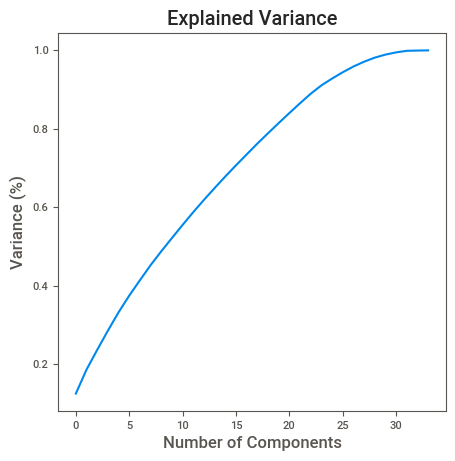

In [95]:
# To check accuracy after dimensionality reduction... the result is not good using pca 
pca = PCA()
principalComponents = pca.fit_transform(Combined)
plt.figure(figsize=(5,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Explained Variance')
plt.show()

In [96]:
# Using 25 features as it has more than 95 percent variance 
pca = PCA(n_components=25)
new_data = pca.fit_transform(Combined)
# This will be the new data fed to the algorithm.
principal_Df = pd.DataFrame(data = new_data
             , columns = ['principal component 1', 'principal component 2','principal component 3',
                          'principal component 4','principal component 5','principal component 6',
                          'principal component 7','principal component 8','principal component 9',
                          'principal component 10','principal component 11','principal component 12',
                          'principal component 13', 'principal component 14','principal component 15',
                          'principal component 16','principal component 17','principal component 18',
                          'principal component 19','principal component 20','principal component 21',
                          'principal component 22','principal component 23','principal component 24','principal component 25'])
principal_Df.head(3)

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7,principal component 8,principal component 9,principal component 10,principal component 11,principal component 12,principal component 13,principal component 14,principal component 15,principal component 16,principal component 17,principal component 18,principal component 19,principal component 20,principal component 21,principal component 22,principal component 23,principal component 24,principal component 25
0,2.186014,2.994062,1.592627,-0.538118,-0.338439,-0.198939,-0.678524,-0.423827,0.820981,-0.377637,-0.167205,-0.191567,0.172607,-0.989926,2.018596,0.042625,-1.868595,-0.007758,-0.291305,-0.923643,-1.081775,0.428867,-0.556366,-0.087052,-0.984601
1,0.055203,-0.440246,-1.323879,0.742613,-1.188709,-1.590469,0.475377,2.918267,-0.059049,-0.836934,1.063128,-2.547366,0.673180,0.716514,-0.183780,1.254464,-0.480239,-0.014150,-0.367868,-0.979934,2.109477,0.537285,-1.413763,0.401708,0.429950
2,3.424011,-1.154260,-1.837951,-0.416836,-1.794157,-1.782081,0.522795,-0.228288,-0.790427,1.008438,1.420525,-1.209928,0.263214,1.722667,-1.000101,0.733486,-1.075060,1.162819,-0.936777,-0.072106,0.108858,-0.426491,-1.283993,0.595737,0.012359


In [97]:
X_train_pca,X_test_pca,y_train_pca,y_test_pca = train_test_split(principal_Df,y,test_size=0.2,random_state=30)

* Used X_train_pca for multiple algorithms but results didnt show quite a good accuracy thats why i didnt implement it in the final work,notwithstanding i just did it as part of feature selection process.


### ALGORITHWISE TRY
#### 1. LOGISTIC REGRESSION.

In [98]:
#Using raw imbalance data 
lr = LogisticRegression(multi_class ='ovr')
lr.fit(X_traintnf,y_train)
y_predict = lr.predict(X_testtnf)
print('Accuracy =',accuracy_score(y_test,y_predict)*100)

Accuracy = 78.33333333333333


In [99]:
#Using balanced data for prediction.
lr = LogisticRegression(multi_class ='ovr')
lr.fit(X_smote,y_smote)
y_predictsm = lr.predict(X_smote)
print('Accuracy =',accuracy_score(y_smote,y_predictsm)*100)

Accuracy = 81.60741885625966


In [100]:
# Tuning hyperparameter
grid={'C':10.0**np.arange(-2,3),'penalty':['l2']}
cv=KFold(n_splits=5,random_state=None,shuffle=False)

clf=GridSearchCV(lr,grid,cv=cv,n_jobs=-1,scoring='f1')

clf.fit(X_train_scaled,y_train)
y_lrtuned=clf.predict(X_test_scaled)

print('Accuracy =',accuracy_score(y_test,y_lrtuned)*100)

Accuracy = 79.66666666666666


In [101]:
#Decision Tree Algotithm
dt=DecisionTreeClassifier() 
dt.fit(X_traintnf,y_train)
y_dt=dt.predict(X_testtnf)
print('Accuracy =',accuracy_score(y_test,y_dt)*100)


Accuracy = 89.66666666666666


In [102]:
#Decision Tree Algotithm with label enceoded dataset.
dt=DecisionTreeClassifier() 
dt.fit(X_train2,y_train2)
y_dt=dt.predict(X_test2)
print('Accuracy =',accuracy_score(y_test2,y_dt)*100)


Accuracy = 87.33333333333333


In [103]:
#Decision Tree Algotithm
dt=DecisionTreeClassifier() 
dt.fit(X_smote,y_smote)
y_dtsm=dt.predict(X_smote)

print('Accuracy =',accuracy_score(y_smote,y_dtsm)*100)


Accuracy = 100.0


In [104]:
#Bagging Decision Tree
dtbagg=BaggingClassifier(base_estimator=dt,n_estimators=20)

dtbagg.fit(X_traintnf,y_train)

dtbaggpred=dtbagg.predict(X_testtnf)

print('Accuracy =',accuracy_score(y_test,dtbaggpred)*100)


Accuracy = 92.0


In [105]:
# Gradient Boost Classifier(GBM)

In [106]:
gb=GradientBoostingClassifier() ## object creation
gb.fit(X_traintnf,y_train) ## fitting the data
y_gb=gb.predict(X_testtnf)#predicting the price

print('Accuracy =',accuracy_score(y_test,y_gb)*100)

Accuracy = 93.33333333333333


In [107]:
gb=GradientBoostingClassifier() ## object creation
gb.fit(X_smote,y_smote) ## fitting the data
y_gbsm=gb.predict(X_smote)#predicting the price

print('Accuracy =',accuracy_score(y_smote,y_gbsm)*100)

Accuracy = 99.69088098918083


In [108]:
#USING NEURAL NETS.

In [109]:
## model creation
from sklearn.neural_network import MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(500,3),
                       learning_rate_init=0.1,
                       max_iter=100,
                       random_state=2) ## model object creation max_iter=Stopping parameter
model.fit(X_traintnf,y_train) ## training the data
y_predict_proba = model.predict_proba(X_testtnf) ## predicting the pro
## bability of class
y_predict = model.predict(X_testtnf)
#y_train_predict = model.predict(X_train2)


In [110]:
## Evaluating the model created
from sklearn.metrics import accuracy_score,confusion_matrix
print("Train accuracy :",accuracy_score(y_test,y_predict)*100)
print("Test accuracy :",accuracy_score(y_test,y_predict)*100)

Train accuracy : 75.66666666666667
Test accuracy : 75.66666666666667


# TASK 4:
###  Recommendations to improve the employee performance based on insights from analysis. 

<AxesSubplot:xlabel='Attrition', ylabel='PerformanceRating'>

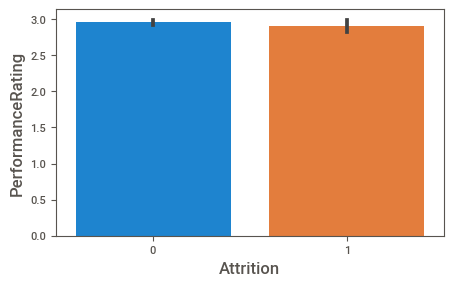

In [111]:
plt.figure(figsize =(5,3))
sns.barplot(x='Attrition',y='PerformanceRating',data=data1)

<AxesSubplot:xlabel='Attrition', ylabel='PerformanceRating'>

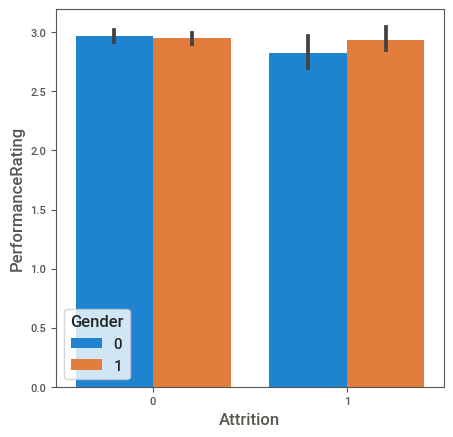

In [112]:
plt.figure(figsize=(5,5))
sns.barplot(x='Attrition',hue='Gender',y='PerformanceRating',data=data1)

### Observation
* numbers that occurs as employees retire or resign and are not replaced. The term is also sometimes used to describe the loss of customers,employees or clients as they mature beyond a product or company's target market without being replaced by a younger generation.
* Replace those employees who comes under Attrition.Because they show less Performance Rating as compare to younger employees.

<AxesSubplot:xlabel='EmpEnvironmentSatisfaction', ylabel='PerformanceRating'>

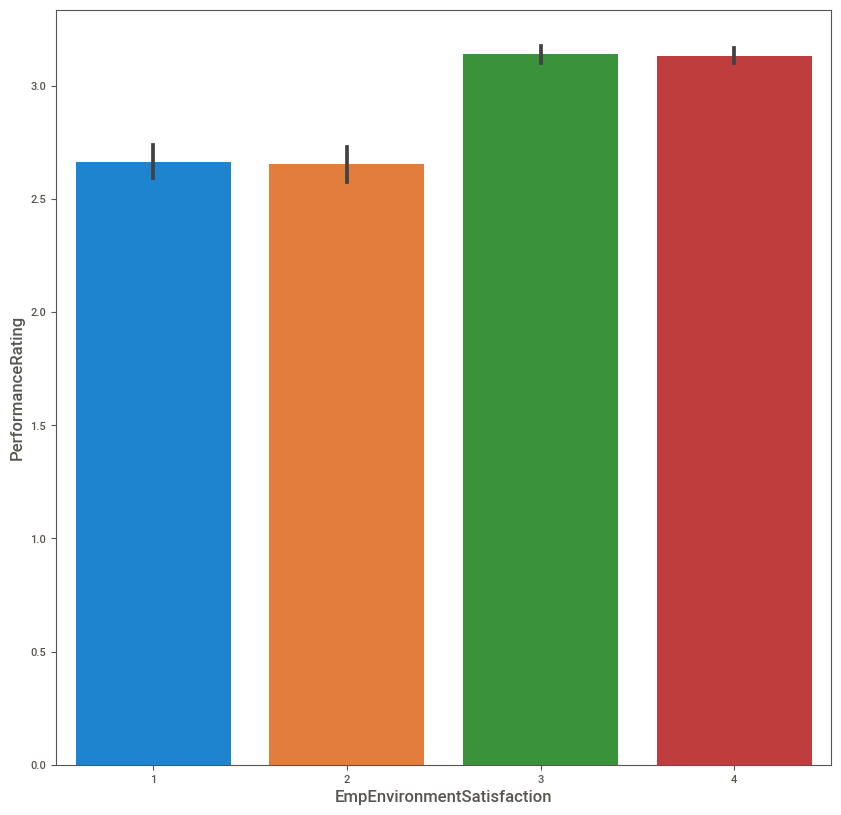

In [113]:

sns.barplot(x='EmpEnvironmentSatisfaction',y='PerformanceRating',data=data1)

<AxesSubplot:xlabel='PerformanceRating', ylabel='YearsSinceLastPromotion'>

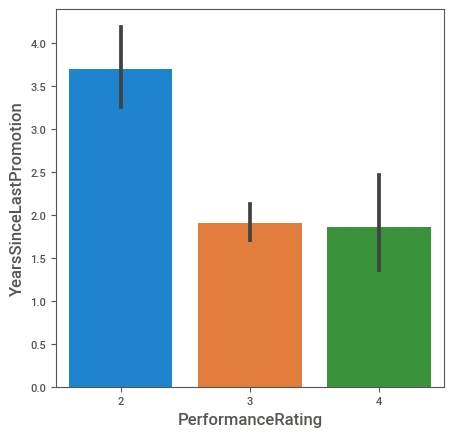

In [114]:
plt.figure(figsize=(5,5))
sns.barplot(x='PerformanceRating',y='YearsSinceLastPromotion',data=data1)

## Observation :
* Promotion is also key point to improve the Perfomance Rating.
* Timely promoted employees give high PerformanceRating.

<AxesSubplot:xlabel='DistanceFromHome', ylabel='PerformanceRating'>

<Figure size 500x500 with 0 Axes>

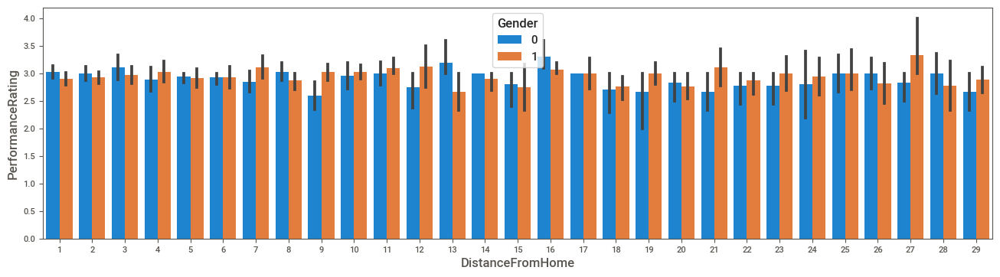

In [115]:
plt.figure(figsize=(5,5))
plt.figure(figsize=(16,4))
sns.barplot(x='DistanceFromHome',hue='Gender',y='PerformanceRating',data=data1)


## Observation:
* To suggest the employees to live near to the comapny .Beacuse nearest loaction of emplyoees have hieghest performance rating.

## Recomendations:
- salary hike will give the boost to the employees to perform well financially and psychologically plus mentally.
-  promotion will help the employees to achieve more performance by giving the chance to be more responsible and leadership qualities and what ever goals are there completed vwet soon .
- The experience years in current role need to be revised while offering the employment to the new employees.
- Employee's work-life will balance affects the performance rating.
- While recruiting for HR, consider the female candidates where they perform well compared to male.
- The development and data science department is having an overall higher performance comparing to rest of the departments.
- If the company focus on the employees work atmosphere satifiscation, salary of employees, plus there promotion all employees in this company will happy and there performance will increase 
